# Prediction using histogram feature and random forest regressor

## Data Analysis


In [ ]:
!unzip /content/14648881b93c11f0.zip

Archive:  /content/14648881b93c11f0.zip
   creating: dataset/
   creating: dataset/Train/
   creating: dataset/Train/images/
  inflating: dataset/Train/images/001230D4-698D-45D6-8C49-DA4CAA7AA84C.tif  
  inflating: dataset/Train/images/00265916-1771-4B2C-A2B7-14BC0041940C.tif  
  inflating: dataset/Train/images/0032C640-EC4F-49AF-ADBE-46A230C78D2C.tif  
  inflating: dataset/Train/images/003C0559-D546-4E49-8514-EC2FB7ADFCA3.tif  
  inflating: dataset/Train/images/006E3128-5258-4A86-BBDB-3DDE844D7C95.tif  
  inflating: dataset/Train/images/00887D5D-C4B0-4B6C-9212-B91D3CDDF397.tif  
  inflating: dataset/Train/images/008B7CD2-969F-4117-90EB-866AEB4DCEC7.tif  
  inflating: dataset/Train/images/008E0AC8-AD49-4EB7-A052-D64E40AD7699.tif  
  inflating: dataset/Train/images/008FC775-391B-461B-8A3E-A8AFBD450C3D.tif  
  inflating: dataset/Train/images/0095796C-BE81-4DC8-BC03-B9FB5A1FCEA7.tif  
  inflating: dataset/Train/images/009915D0-4ED8-4EF8-B706-D5C7DD1C2765.tif  
  inflating: dataset/Train/i

### loading the data

In [ ]:
import pandas as pd
data = pd.read_csv("/content/dataset/Train/sliders.csv")

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2538 entries, 0 to 2537
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   copyCreationTime  2538 non-null   int64  
 1   captureTime       2538 non-null   object 
 2   touchTime         2538 non-null   float64
 3   id_global         2538 non-null   object 
 4   grayscale         2538 non-null   int64  
 5   aperture          2538 non-null   float64
 6   flashFired        2538 non-null   int64  
 7   focalLength       2538 non-null   float64
 8   isoSpeedRating    2538 non-null   int64  
 9   shutterSpeed      2538 non-null   float64
 10  Temperature       2538 non-null   int64  
 11  Tint              2538 non-null   int64  
 12  currTemp          2538 non-null   int64  
 13  currTint          2538 non-null   int64  
dtypes: float64(4), int64(8), object(2)
memory usage: 277.7+ KB


In [ ]:
print(data)

      copyCreationTime             captureTime    touchTime  \
0         -63113817600  2024-01-14T16:56:50.67  741426608.1   
1         -63113817600  2023-05-28T20:08:51.87  741426607.1   
2         -63113817600  2023-06-09T20:54:30.13  741426607.2   
3         -63113817600  2022-06-10T13:02:12.98  741426606.5   
4         -63113817600     2023-09-30T17:08:05  741426607.8   
...                ...                     ...          ...   
2533      -63113817600     2023-04-29T13:08:01  741426614.3   
2534      -63113817600  2022-07-23T14:43:33.05  741426614.3   
2535      -63113817600  2023-05-27T21:59:26.48  741426607.0   
2536      -63113817600  2023-02-18T15:33:20.46  741426606.9   
2537      -63113817600  2023-06-03T20:17:42.09  741426607.2   

                                 id_global  grayscale  aperture  flashFired  \
0     C68C8010-495C-4427-9F4D-664C2D71EFAD          0  2.970854           1   
1     8EFC0EC0-0936-41CC-81BD-513B35D2CB23          0  7.614710           1   
2     

In [ ]:
print(data.iloc[0])

copyCreationTime                            -63113817600
captureTime                       2024-01-14T16:56:50.67
touchTime                                    741426608.1
id_global           C68C8010-495C-4427-9F4D-664C2D71EFAD
grayscale                                              0
aperture                                        2.970854
flashFired                                             1
focalLength                                        100.0
isoSpeedRating                                      1250
shutterSpeed                                    7.965784
Temperature                                         4150
Tint                                                   2
currTemp                                            6317
currTint                                               4
Name: 0, dtype: object


In [ ]:
print(data['id_global'])

0       C68C8010-495C-4427-9F4D-664C2D71EFAD
1       8EFC0EC0-0936-41CC-81BD-513B35D2CB23
2       4A28220F-024E-4637-80ED-B4533578AFEB
3       05A76E40-9B2C-40FD-95D4-EF976598640C
4       B63A179E-232C-4133-BB24-8784B60DECEE
                        ...                 
2533    A64C2AE0-BDEE-44A1-9AE6-6C09A8D00CB5
2534    BC3423C1-7489-4893-826B-5D4C6FE1FC8D
2535    8AEEE3B8-4318-4AF8-94D4-831B3AAF63C3
2536    8B665A1D-8FBF-4F41-BCA7-5DF3D9CDF405
2537    CF61E9B0-6EEC-491F-A40B-E5D312B4D622
Name: id_global, Length: 2538, dtype: object


In [ ]:
print(data[['Temperature', 'Tint']])

      Temperature  Tint
0            4150     2
1            4700     4
2            5000    12
3            3150     9
4            3633     4
...           ...   ...
2533         4300    10
2534         5400     9
2535         3500   -10
2536         5500    16
2537         4950    10

[2538 rows x 2 columns]


### visualizing distribution target values

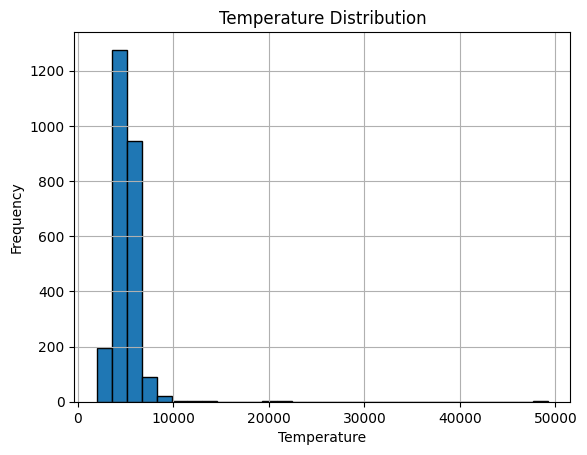

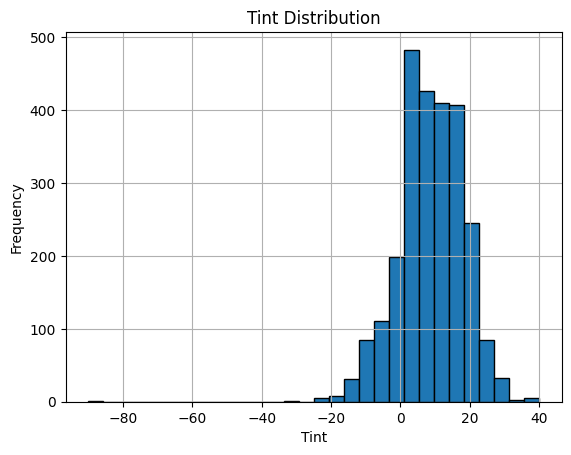

In [ ]:
import matplotlib.pyplot as plt

data['Temperature'].hist(bins=30, edgecolor='black')
plt.title('Temperature Distribution')
plt.xlabel('Temperature')
plt.ylabel('Frequency')
plt.show()

data['Tint'].hist(bins=30, edgecolor='black')
plt.title('Tint Distribution')
plt.xlabel('Tint')
plt.ylabel('Frequency')
plt.show()


### Image visualization (2K to 2.5K temperature values)


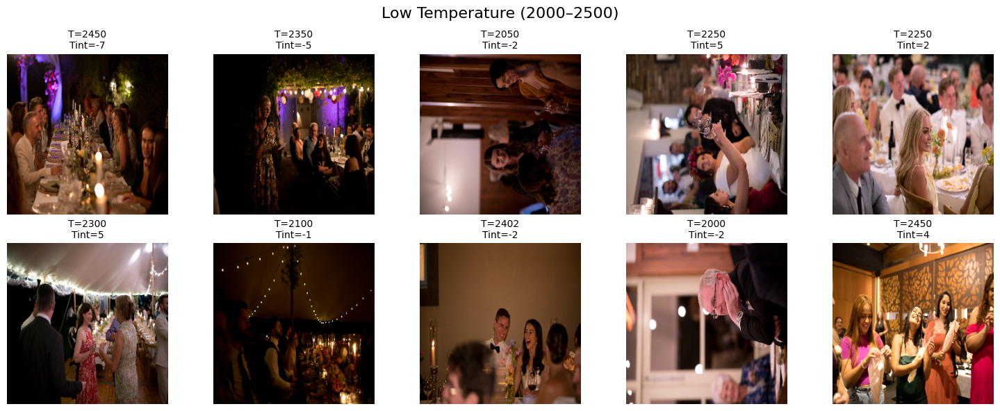

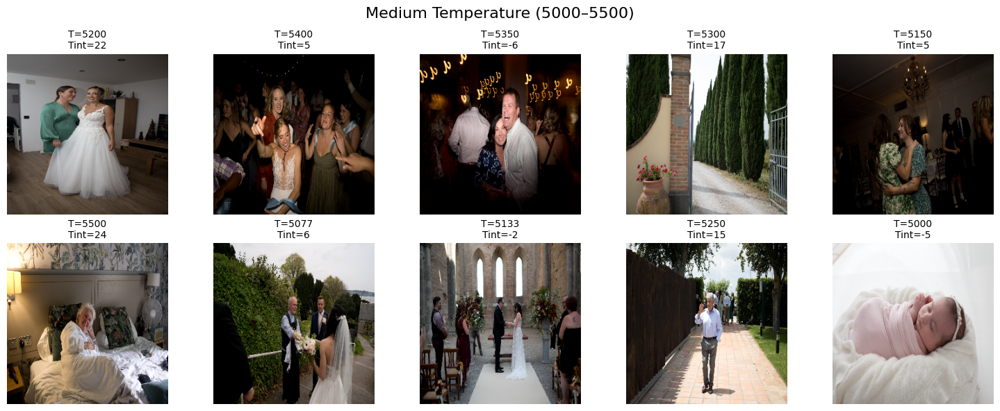

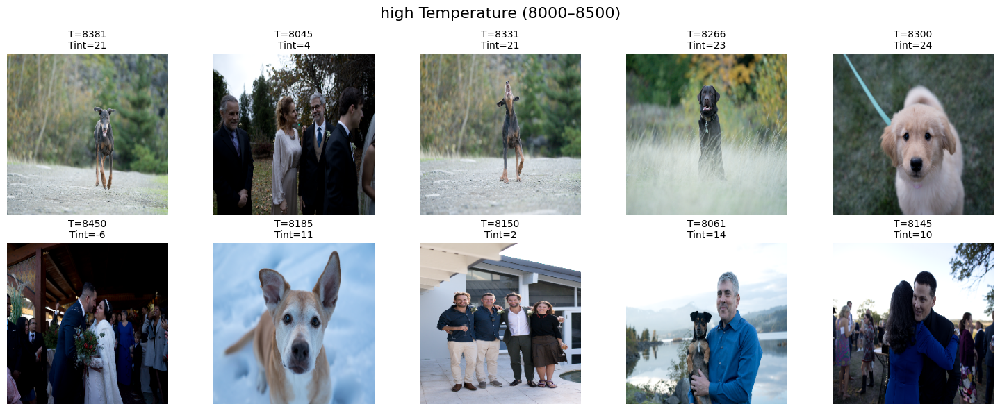

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import random
import os

# Load your metadata CSV
df = pd.read_csv('/content/dataset/Train/sliders.csv')  # change filename if needed

# Filter temperature ranges
low_temp = df[(df['Temperature'] >= 2000) & (df['Temperature'] <= 2500)]
mid_temp = df[(df['Temperature'] >= 5000) & (df['Temperature'] <= 5500)]
high_temp = df[(df['Temperature'] >= 8000) & (df['Temperature'] <= 8500)]

# Randomly sample 10 from each range
low_samples = low_temp.sample(n=10, random_state=24)
mid_samples = mid_temp.sample(n=10, random_state=24)
high_samples = high_temp.sample(n=10, random_state=24)

# Define image base directory
image_dir = '/content/dataset/Train/images/'

# Function to show samples
def show_samples(df_subset, title):
    fig, axes = plt.subplots(2, 5, figsize=(15, 6))
    fig.suptitle(title, fontsize=16)
    axes = axes.flatten()

    for i, (idx, row) in enumerate(df_subset.iterrows()):
        try:
            img_path = os.path.join(image_dir, f"{row['id_global']}.tif")
            img = Image.open(img_path).convert("RGB")
            img = img.resize((256, 256))  # resize for faster visualization

            axes[i].imshow(img)
            axes[i].set_title(f"T={row['Temperature']:.0f}\nTint={row['Tint']:.0f}", fontsize=10)
            axes[i].axis('off')

        except Exception as e:
            print(f"⚠️ Could not load {row['id_global']}: {e}")
            axes[i].axis('off')

    plt.tight_layout()
    plt.show()

# Display two temperature groups
show_samples(low_samples, "Low Temperature (2000–2500)")
show_samples(mid_samples, "Medium Temperature (5000–5500)")
show_samples(high_samples, "high Temperature (8000–8500)")


### histogram visualization (2K to 2.5K temperature values)

Image: 3E9902CA-CC8B-4B0C-926B-39CF68D0FF1C
Temperature: 2450 | Tint: -7 |Mean RGB: [72.72241211 45.39520264 34.62841797]


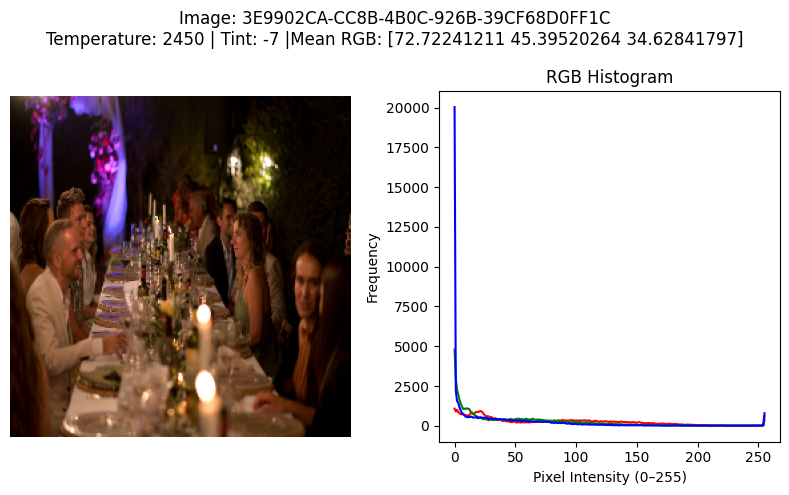

Image: 92676D16-C13E-4ACF-978C-A80A3BB65651
Temperature: 2350 | Tint: -5 |Mean RGB: [36.93737793 22.51029968 18.048172  ]


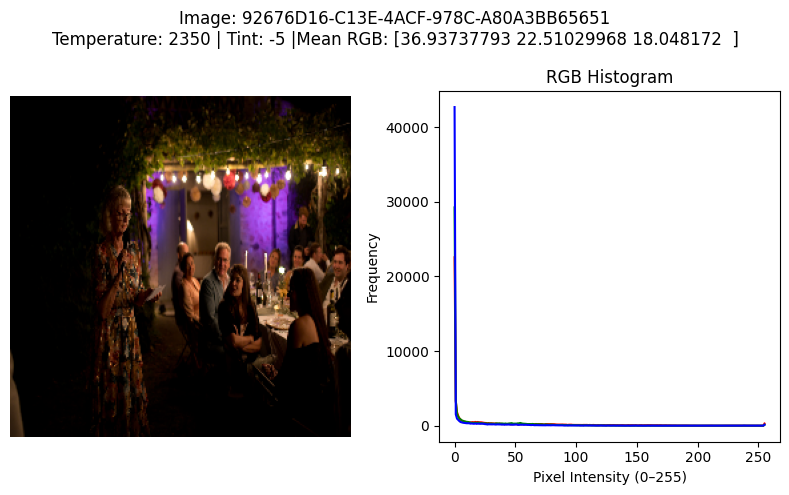

Image: 87111E3D-C1C5-4AB3-89A9-000DF1237028
Temperature: 2050 | Tint: -2 |Mean RGB: [81.11451721 51.94789124 45.11917114]


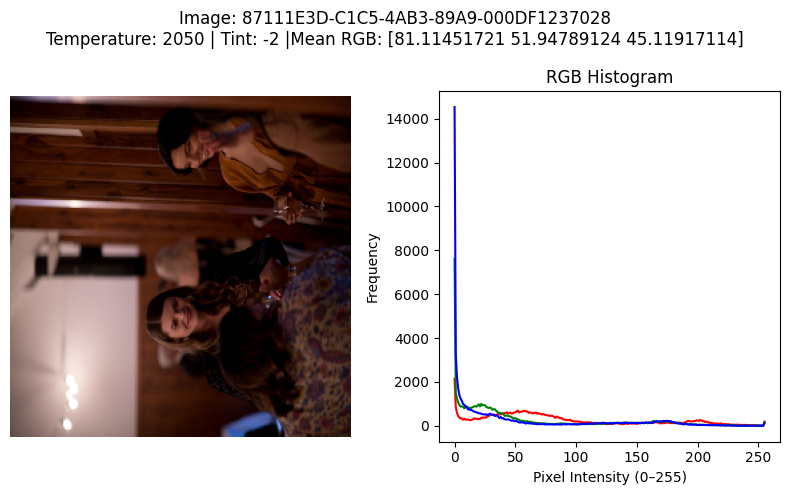

Image: 4414520C-BEE5-410E-9D3E-7AC2DB854663
Temperature: 2250 | Tint: 5 |Mean RGB: [112.34516907  86.40510559  82.65415955]


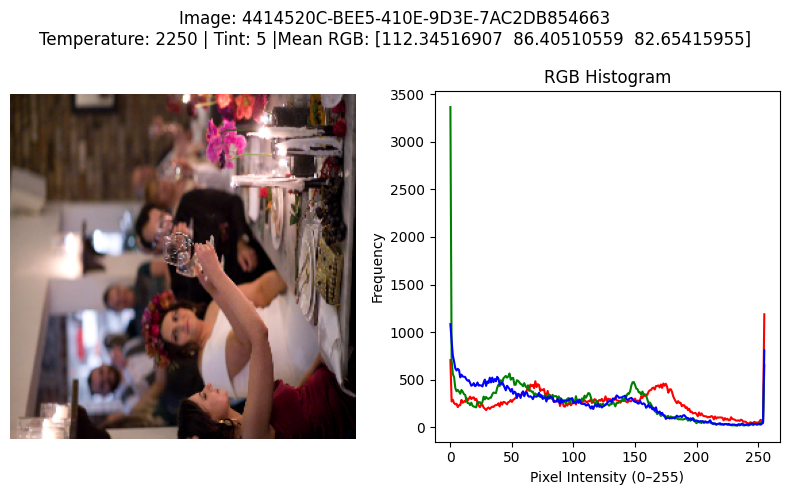

Image: D89C454E-5441-4925-8A96-0D15C2E501D8
Temperature: 2250 | Tint: 2 |Mean RGB: [144.45570374 111.52664185  99.71556091]


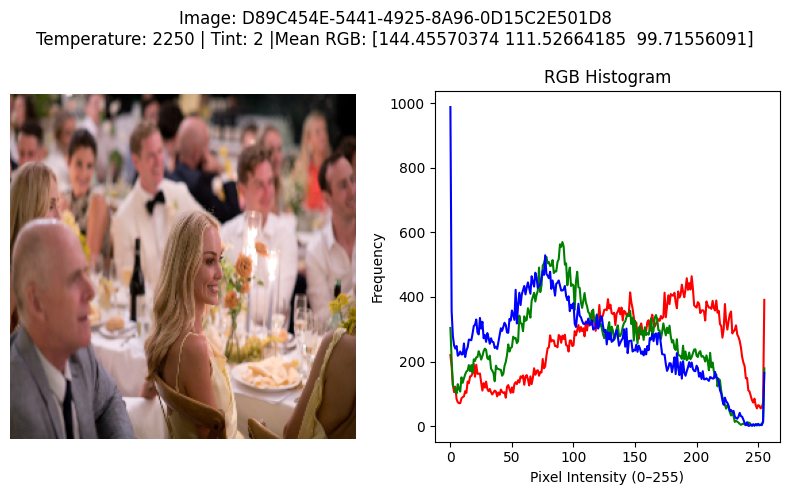

Image: 2A659B31-A575-49C1-AEBE-EBC849C3E46F
Temperature: 2300 | Tint: 5 |Mean RGB: [88.13200378 70.42555237 62.84355164]


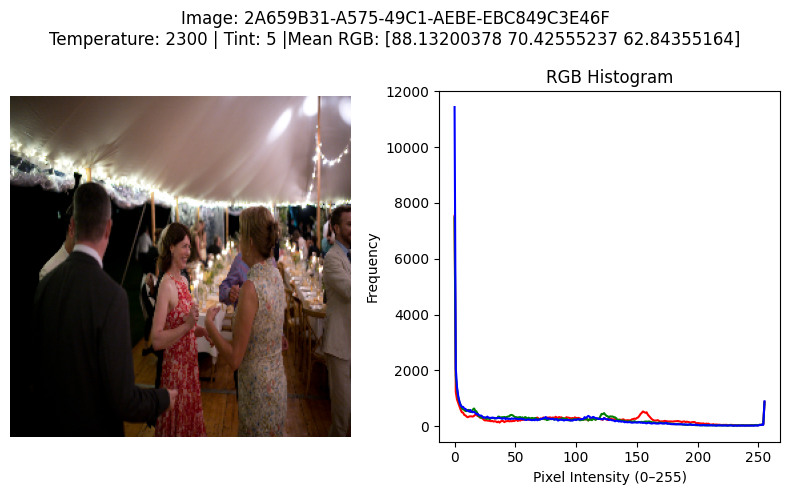

Image: B484B916-F230-4125-9F79-C9CD985983AE
Temperature: 2100 | Tint: -1 |Mean RGB: [31.24401855 13.603302    2.55476379]


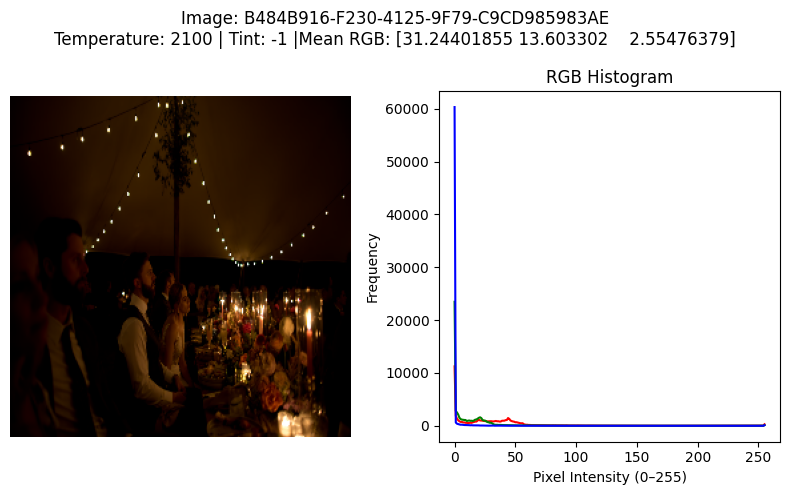

Image: 16BEAC19-D677-497B-A1E0-955B5A291308
Temperature: 2402 | Tint: -2 |Mean RGB: [91.59838867 57.16748047 32.60054016]


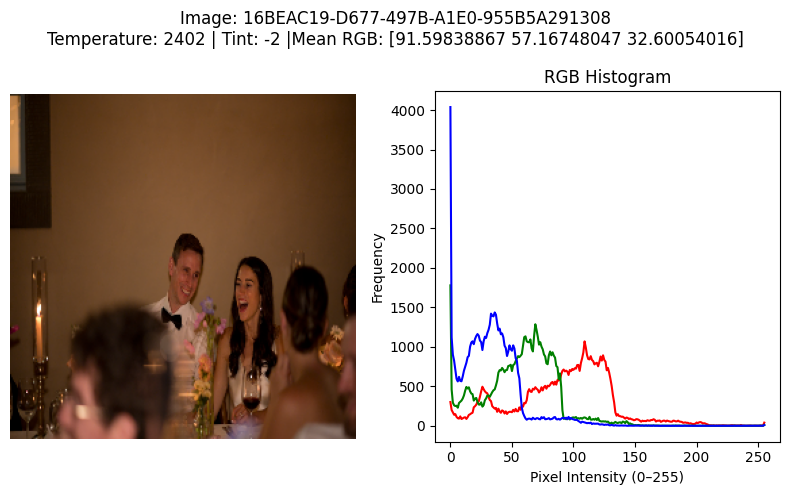

Image: D8DB8C2D-96CE-449C-919F-F9D7160DDEB5
Temperature: 2000 | Tint: -2 |Mean RGB: [121.42411804  87.5328064   80.57252502]


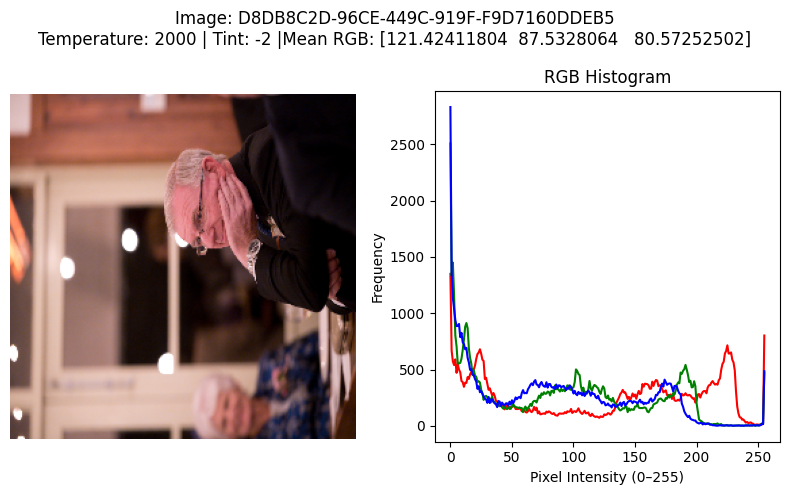

Image: 96B7A84E-C0FB-46B3-8E9E-4EEBE2B5BAC1
Temperature: 2450 | Tint: 4 |Mean RGB: [145.74143982  88.45422363  55.70610046]


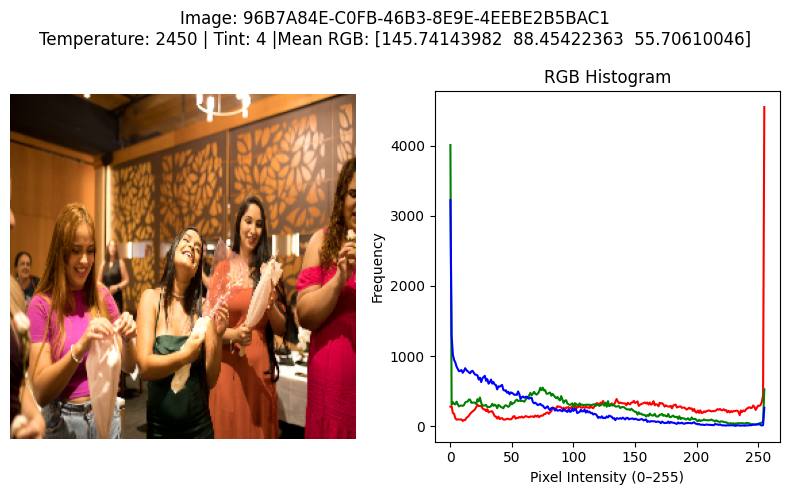

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

# Base directory
image_dir = "/content/dataset/Train/images/"

# Loop through each row in low_samples
for i in range(len(low_samples)):
    img_id = low_samples['id_global'].iloc[i]
    temp = low_samples['Temperature'].iloc[i]
    tint = low_samples['Tint'].iloc[i]

    # Build image path
    img_path = os.path.join(image_dir, f"{img_id}.tif")

    # Read and convert to RGB
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Could not load {img_id}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    means = img.reshape(-1, 3).mean(axis=0)
    print(f"Image: {img_id}\nTemperature: {temp:.0f} | Tint: {tint:.0f} |Mean RGB: {means}")
    # Create figure
    fig, axes = plt.subplots(1, 2, figsize=(8, 5))
    fig.suptitle(f"Image: {img_id}\nTemperature: {temp:.0f} | Tint: {tint:.0f} |Mean RGB: {means}", fontsize=12)

    # ---- Left: Show image ----
    axes[0].imshow(img)
    axes[0].axis('off')


    # ---- Right: RGB histogram ----
    colors = ('r', 'g', 'b')
    for j, col in enumerate(colors):
        hist = cv2.calcHist([img], [j], None, [256], [0, 256])
        axes[1].plot(hist, color=col)
    axes[1].set_title("RGB Histogram")
    axes[1].set_xlabel("Pixel Intensity (0–255)")
    axes[1].set_ylabel("Frequency")

    plt.tight_layout()
    plt.show()



Inference

| Image | Temp (K) | Tint | Mean R | Mean G | Mean B |
| ----- | -------- | ---- | ------ | ------ | ------ |
| 3E99… | 2450     | -7   | 72.7   | 45.4   | 34.6   |
| 9267… | 2350     | -5   | 36.9   | 22.5   | 18.0   |
| 8711… | 2050     | -2   | 81.1   | 51.9   | 45.1   |
| 4414… | 2250     | +5   | 112.3  | 86.4   | 82.6   |
| D89C… | 2250     | +2   | 144.4  | 111.5  | 99.7   |
| 16BE… | 2402     | -2   | 91.6   | 57.1   | 32.6   |
| D8DB… | 2000     | -2   | 121.4  | 87.5   | 80.6   |
| 96B7… | 2450     | +4   | 145.7  | 88.4   | 55.7   |


At low temperatures (2000–2500 K) → images should be warm (reddish/yellowish).
That means: R > G > B.

Tint adjusts the balance between green and magenta:

Negative tint → more greenish

Positive tint → more magenta/reddish

### histogram visualization (5K to 5.5K temperature values)

Image: C0C0A5B6-A367-4D94-903B-FF644EBA6A5A
Temperature: 5200 | Tint: 22 |Mean RGB: [97.50958252 92.54745483 87.24542236]


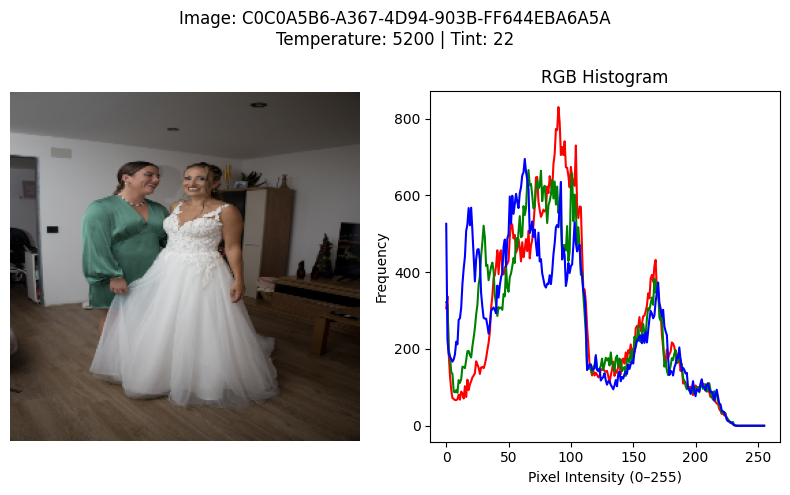

Image: E12F4C9D-B6C5-4189-A6DD-2B37CD26ACE5
Temperature: 5400 | Tint: 5 |Mean RGB: [44.60321045 31.88183594 23.90153503]


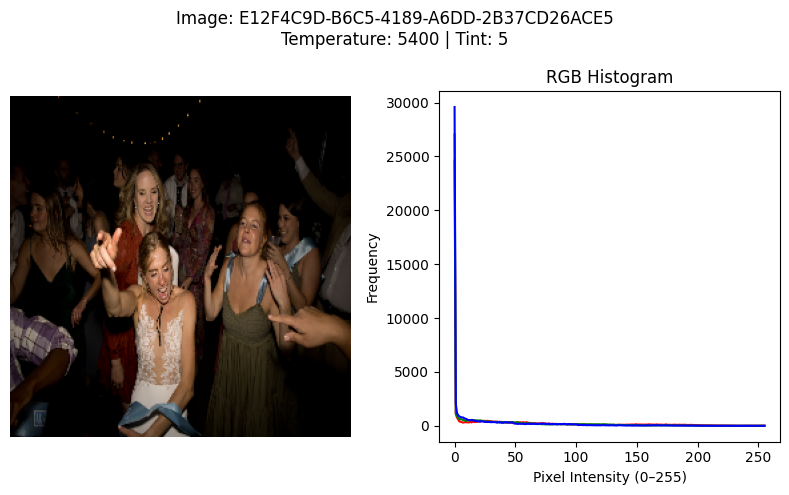

Image: AE745A42-0955-45B8-86BC-BEA298E52942
Temperature: 5350 | Tint: -6 |Mean RGB: [45.91912842 32.37260437 27.34268188]


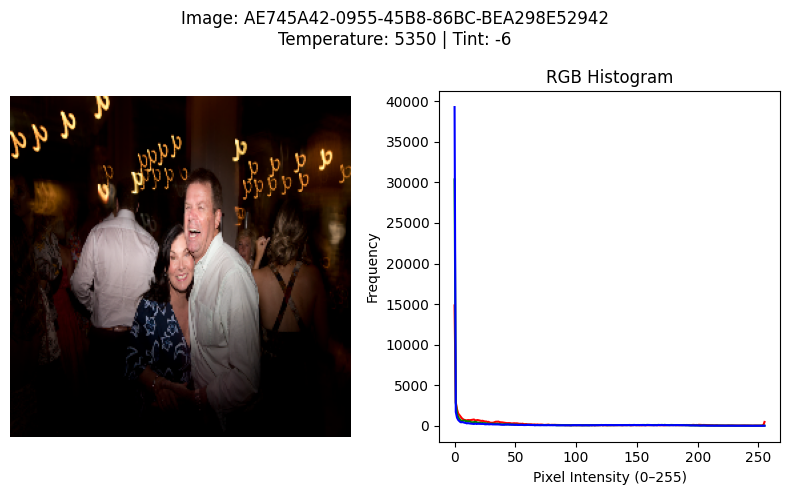

Image: 8DDFA494-6739-428B-B2A8-A257F640E4C3
Temperature: 5300 | Tint: 17 |Mean RGB: [94.82783508 93.96492004 78.8452301 ]


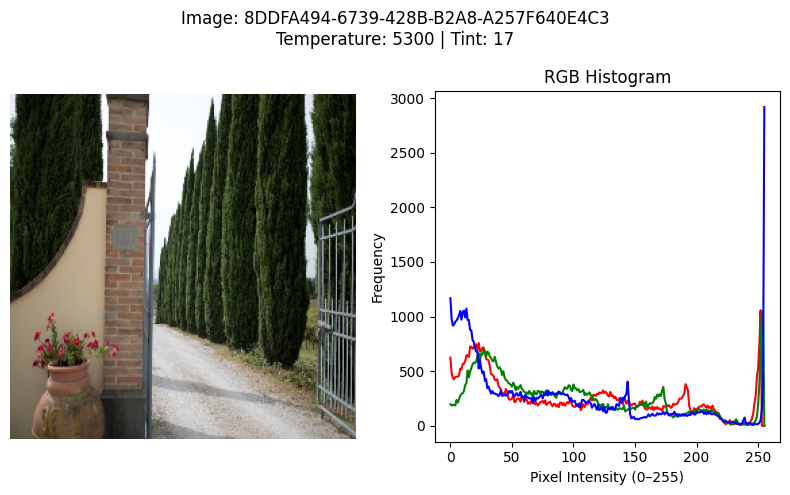

Image: 7C2C0F03-2E1D-4E5B-B4B8-416D90ED9415
Temperature: 5150 | Tint: 5 |Mean RGB: [30.79333496 23.97576904 17.6309967 ]


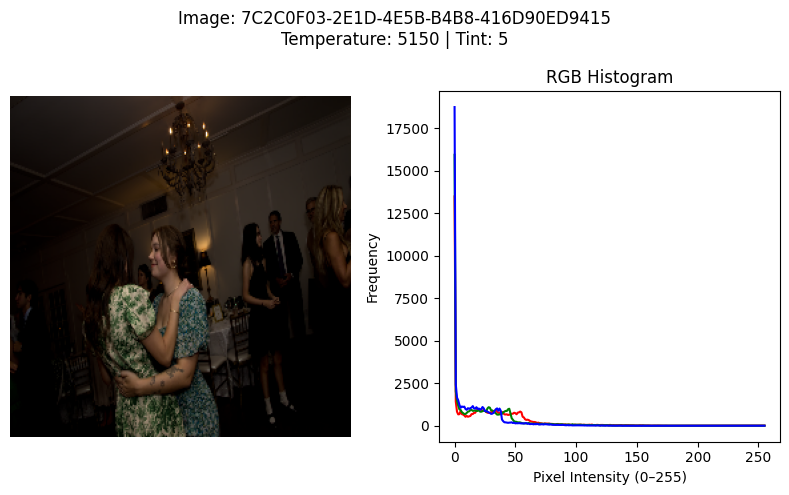

Image: D4A2FF9C-6B5A-41FE-806C-4E30638DE012
Temperature: 5500 | Tint: 24 |Mean RGB: [118.33787537 106.18283081  91.86750793]


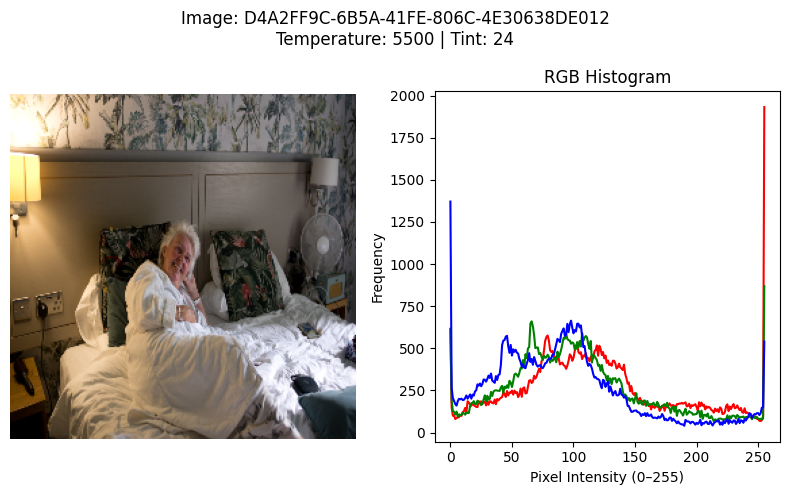

Image: FC686736-BED3-4385-A8DF-EFE4C1CB2A34
Temperature: 5077 | Tint: 6 |Mean RGB: [86.32601929 84.52616882 70.87188721]


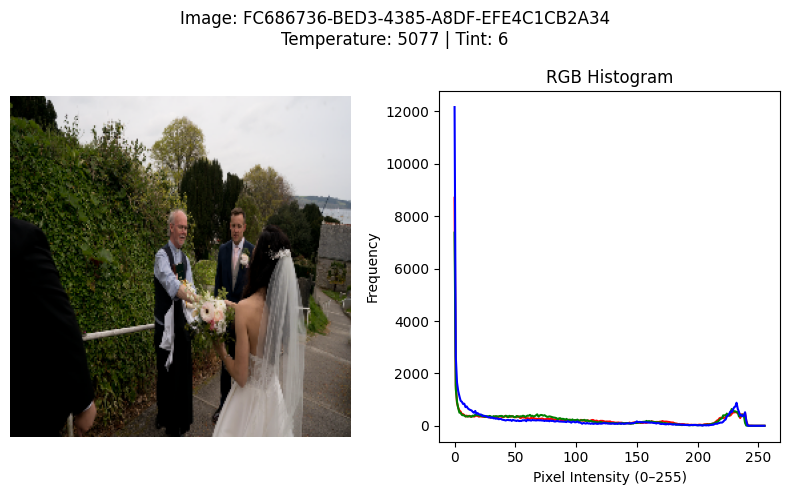

Image: D04C83A0-3186-45BE-9380-6CFF33084B98
Temperature: 5133 | Tint: -2 |Mean RGB: [96.65177917 90.80949402 86.86079407]


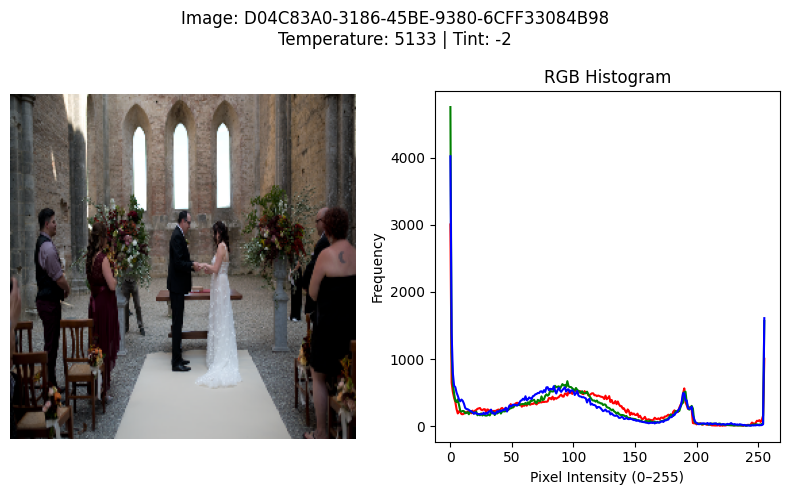

Image: 87823E60-44B3-4A1E-A9B6-BCAA942599F5
Temperature: 5250 | Tint: 15 |Mean RGB: [106.66162109 100.94564819  90.88917542]


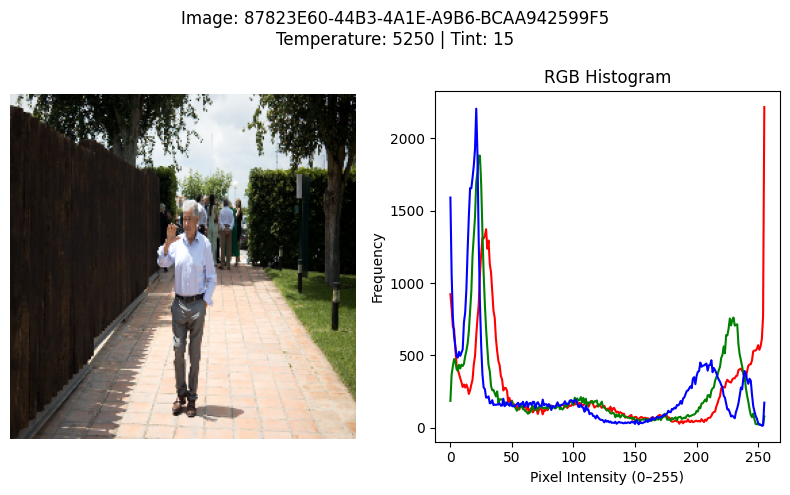

Image: 0939AFBF-1581-438A-896F-E0531DCF95B7
Temperature: 5000 | Tint: -5 |Mean RGB: [201.51376343 194.09069824 192.54963684]


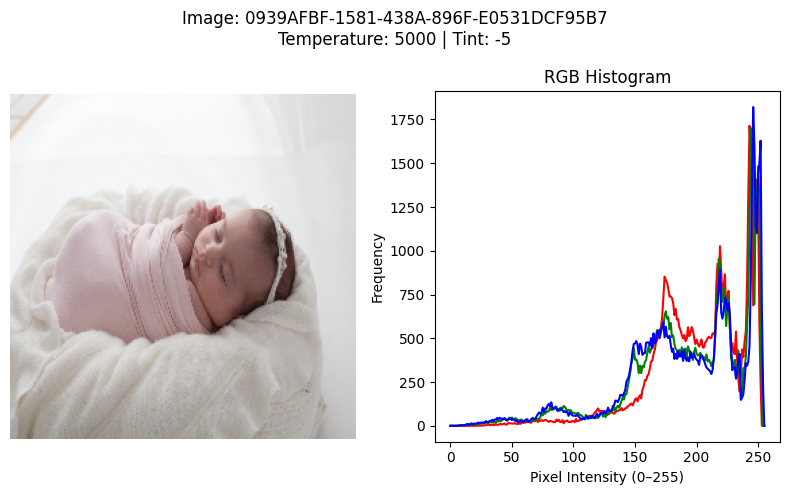

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

# Base directory
image_dir = "/content/dataset/Train/images/"

# Loop through each row in low_samples
for i in range(len(mid_samples)):
    img_id = mid_samples['id_global'].iloc[i]
    temp = mid_samples['Temperature'].iloc[i]
    tint = mid_samples['Tint'].iloc[i]

    # Build image path
    img_path = os.path.join(image_dir, f"{img_id}.tif")

    # Read and convert to RGB
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Could not load {img_id}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    means = img.reshape(-1, 3).mean(axis=0)
    print(f"Image: {img_id}\nTemperature: {temp:.0f} | Tint: {tint:.0f} |Mean RGB: {means}")

    # Create figure
    fig, axes = plt.subplots(1, 2, figsize=(8, 5))
    fig.suptitle(f"Image: {img_id}\nTemperature: {temp:.0f} | Tint: {tint:.0f}", fontsize=12)

    # ---- Left: Show image ----
    axes[0].imshow(img)
    axes[0].axis('off')

    # ---- Right: RGB histogram ----
    colors = ('r', 'g', 'b')
    for j, col in enumerate(colors):
        hist = cv2.calcHist([img], [j], None, [256], [0, 256])
        axes[1].plot(hist, color=col)
    axes[1].set_title("RGB Histogram")
    axes[1].set_xlabel("Pixel Intensity (0–255)")
    axes[1].set_ylabel("Frequency")

    plt.tight_layout()
    plt.show()

### histogram visualization (8K to 8.5K temperature values)

Image: DA770DFF-E5A2-4F70-8C7F-79568FB29174
Temperature: 8381 | Tint: 21 |Mean RGB: [132.06716919 141.97503662 127.21498108]


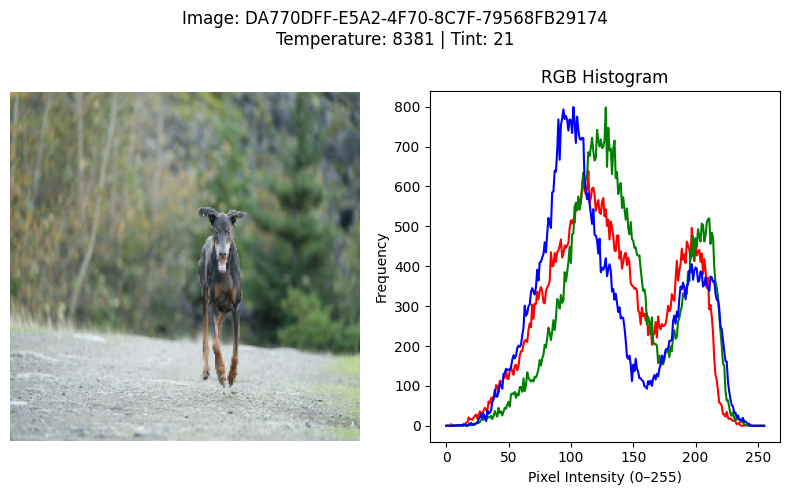

Image: 1970CCDD-D41E-4BCC-B0EA-1B06E9F8290C
Temperature: 8045 | Tint: 4 |Mean RGB: [60.11872864 61.0133667  62.0581665 ]


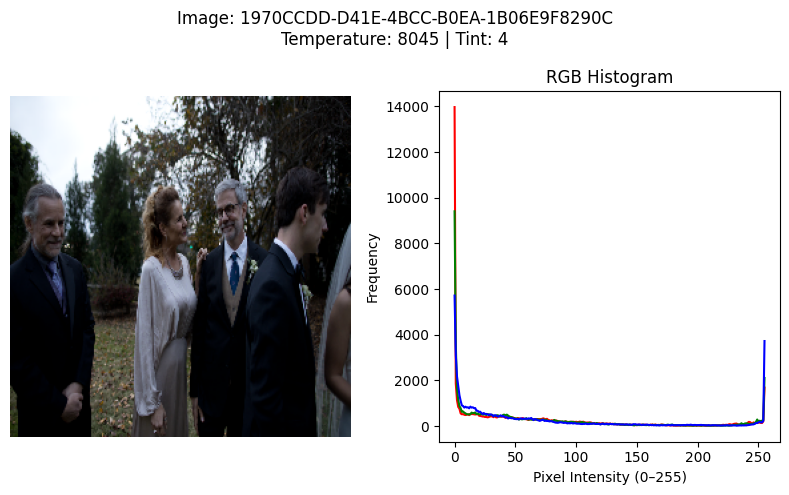

Image: 1A446C0A-1F91-47FE-AAE8-B36B3318A708
Temperature: 8331 | Tint: 21 |Mean RGB: [135.86833191 144.61003113 133.77185059]


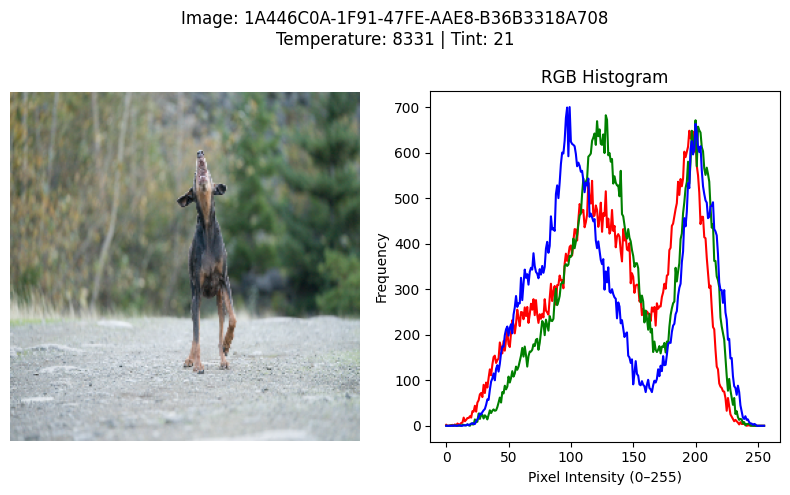

Image: A08D108B-A5B1-4F8A-B83E-DB1DCC1E1C21
Temperature: 8266 | Tint: 23 |Mean RGB: [142.41311646 154.9581604  136.21647644]


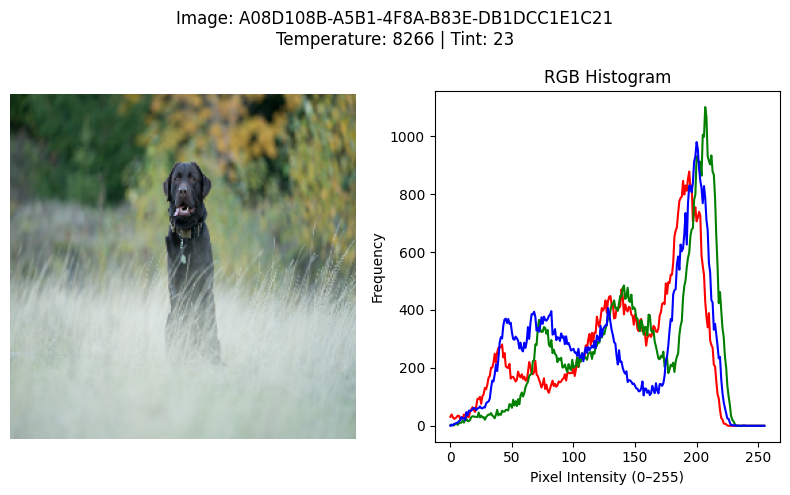

Image: D87BD244-52E8-4394-BFE4-D771BFC9B71F
Temperature: 8300 | Tint: 24 |Mean RGB: [87.54139709 94.85746765 92.04776001]


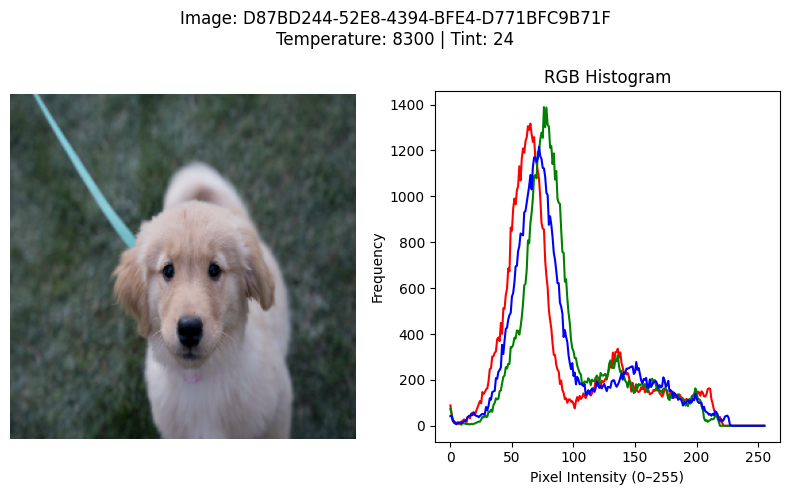

Image: 12DFC993-6B80-42DA-8913-F2FBEC214AEA
Temperature: 8450 | Tint: -6 |Mean RGB: [31.77386475 31.56367493 38.66841125]


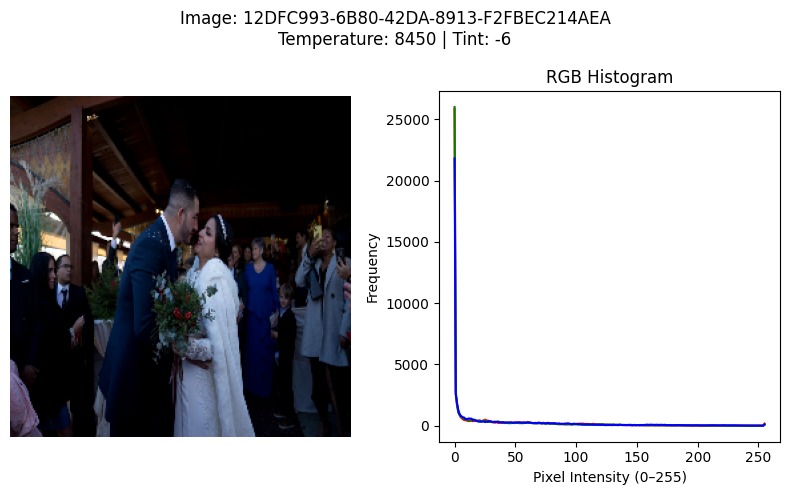

Image: 0E6B2D91-7121-4F32-A73D-7157210E89CD
Temperature: 8185 | Tint: 11 |Mean RGB: [141.89517212 166.32730103 192.34695435]


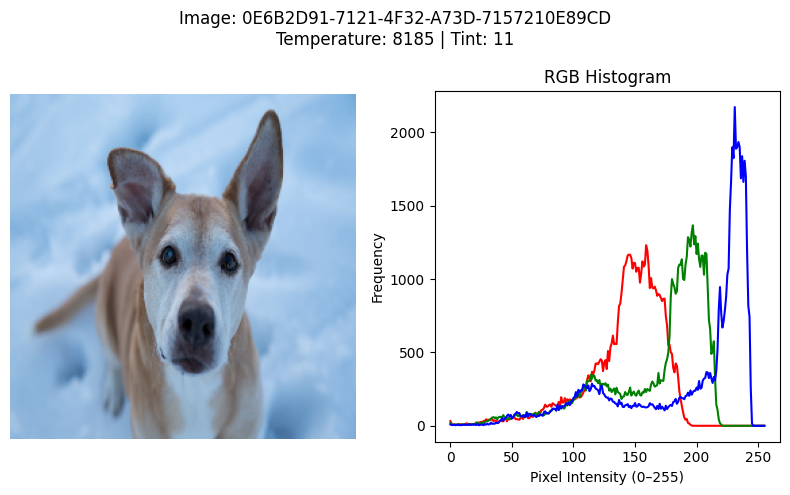

Image: F0C6D504-F480-4182-9D66-F8E237FDE423
Temperature: 8150 | Tint: 2 |Mean RGB: [137.38952637 139.52024841 147.65551758]


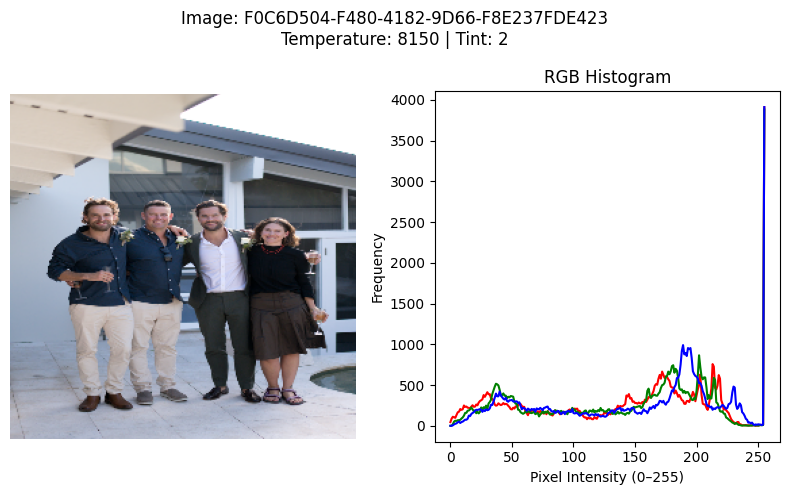

Image: 8C453A9B-0D67-4D90-9C91-F46D381CC316
Temperature: 8061 | Tint: 14 |Mean RGB: [161.10862732 179.20079041 192.49778748]


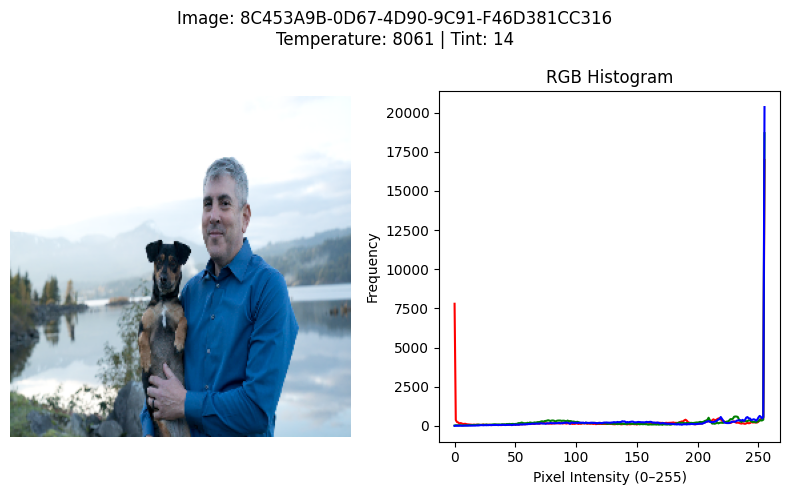

Image: F44063F2-B8F0-4280-82D2-80CBB3B97F8E
Temperature: 8145 | Tint: 10 |Mean RGB: [109.12158203 112.53559875 124.77268982]


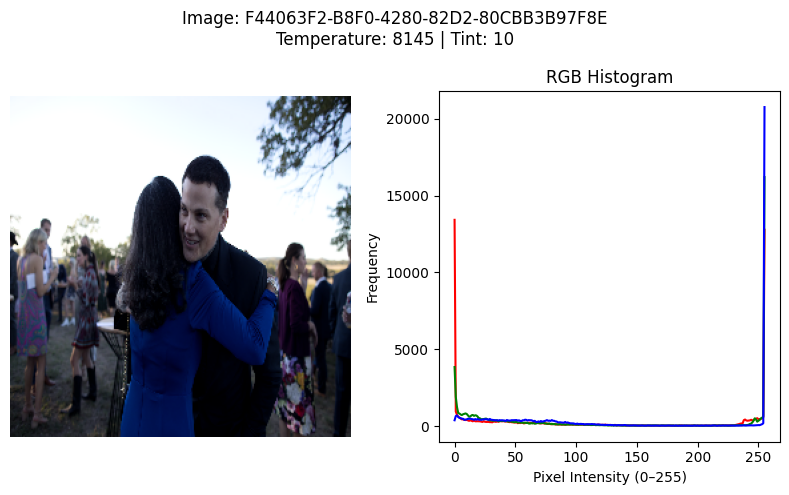

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os

# Base directory
image_dir = "/content/dataset/Train/images/"

# Loop through each row in low_samples
for i in range(len(mid_samples)):
    img_id = high_samples['id_global'].iloc[i]
    temp = high_samples['Temperature'].iloc[i]
    tint = high_samples['Tint'].iloc[i]

    # Build image path
    img_path = os.path.join(image_dir, f"{img_id}.tif")

    # Read and convert to RGB
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Could not load {img_id}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    means = img.reshape(-1, 3).mean(axis=0)
    print(f"Image: {img_id}\nTemperature: {temp:.0f} | Tint: {tint:.0f} |Mean RGB: {means}")

    # Create figure
    fig, axes = plt.subplots(1, 2, figsize=(8, 5))
    fig.suptitle(f"Image: {img_id}\nTemperature: {temp:.0f} | Tint: {tint:.0f}", fontsize=12)

    # ---- Left: Show image ----
    axes[0].imshow(img)
    axes[0].axis('off')

    # ---- Right: RGB histogram ----
    colors = ('r', 'g', 'b')
    for j, col in enumerate(colors):
        hist = cv2.calcHist([img], [j], None, [256], [0, 256])
        axes[1].plot(hist, color=col)
    axes[1].set_title("RGB Histogram")
    axes[1].set_xlabel("Pixel Intensity (0–255)")
    axes[1].set_ylabel("Frequency")

    plt.tight_layout()
    plt.show()

Observation

Temperature–RGB Relationship

Temperature (Kelvin) affects the blue–orange balance:

Lower temp → red/orange dominant (warm tones)

Higher temp → blue/white dominant (cool tones)

Tint affects the green–magenta axis:

Positive tint → more greenish

Negative tint → more magenta/pinkish

So the mean RGB should reflect these:

R↑ when temperature ↓

G↑ when tint ↑

B↑ when temperature ↑

## Feature extraction

Extracting histogram features

In [ ]:
import cv2
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
import os

# === 1️⃣ Load dataset ===
df = pd.read_csv("/content/dataset/Train/sliders.csv")
image_dir = "/content/dataset/Train/images/"

# Create full image paths
df["image_path"] = df["id_global"].apply(lambda x: os.path.join(image_dir, f"{x}.tif"))

# === 2️⃣ Define feature extractor (RGB histograms) ===
def extract_histogram_features(image_path):
    try:
        img = cv2.imread(image_path)
        if img is None:
            return np.zeros(768)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        hist_features = []
        for i in range(3):
            hist = cv2.calcHist([img], [i], None, [256], [0, 256]).flatten()
            hist = hist / (hist.sum() + 1e-6)  # normalize safely per image
            hist_features.extend(hist)
        return np.array(hist_features)
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
        return np.zeros(768)

# === 3️⃣ Extract features ===
print("Extracting histograms...")
X = np.array([extract_histogram_features(p) for p in df["image_path"]])
print("Feature matrix shape:", X.shape)

# === 4️⃣ Normalize the feature matrix ===
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
print("Features normalized ✅")

# === 5️⃣ Apply PCA ===
pca = PCA(n_components=50, random_state=42)
X_pca = pca.fit_transform(X_scaled)
print("After PCA:", X_pca.shape)


Extracting histograms...
Feature matrix shape: (2538, 768)
Features normalized ✅
After PCA: (2538, 50)


## Training using random forest regressor

In [ ]:
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score

# === 1️⃣ Targets ===
df['Temperature'] = np.log(df["Temperature"]) # log of the temperature values
df['Tint'] = (df["Tint"] + 150) / 30 # addition and division to make it positive and bringing to a lower values
y = df[['Temperature', 'Tint']].values  # shape: (n_samples, 2)

# === 2️⃣ Train-test split ===
X_train, X_test, y_train, y_test = train_test_split(
    X_pca, y, test_size=0.2, random_state=42
)

# === 3️⃣ Define multi-output regression model ===
base_model = RandomForestRegressor(n_estimators=200, random_state=42, n_jobs=-1)
model = MultiOutputRegressor(base_model)

# === 4️⃣ Train ===
model.fit(X_train, y_train)




MultiOutputRegressor(estimator=RandomForestRegressor(n_estimators=200,
                                                     n_jobs=-1,
                                                     random_state=42))

## Evaluation

In [ ]:
from sklearn.metrics import mean_absolute_error
y_pred = model.predict(X_test)

# suppose these are your true and predicted values
y_temp_true = y_test[:, 0]
y_temp_pred = y_pred[:, 0]
y_tint_true = y_test[:, 1]
y_tint_pred = y_pred[:, 1]

# compute standard MAE
mae_temp = mean_absolute_error(y_temp_true, y_temp_pred)
mae_tint = mean_absolute_error(y_tint_true, y_tint_pred)

# convert MAE to "score" form
score_temp = 1 / (1 + mae_temp)
score_tint = 1 / (1 + mae_tint)


avg_score = (score_temp + score_tint) / 2
print(f"Average Model Score: {avg_score:.5f}")


Average Model Score: 0.84539


## Validation results

In [ ]:
from PIL import Image
import pandas as pd
import numpy as np
import os
from tqdm import tqdm


# ==== 4️⃣ Load validation/test CSV ====
csv_val = "/content/dataset/Validation/sliders_input.csv"
val_dir = "/content/dataset/Validation/images/"
df_val = pd.read_csv(csv_val)
df_val["image_path"] = df_val["id_global"].apply(lambda x: os.path.join(val_dir, f"{x}.tif"))

# === 3️⃣ Extract features ===
print("Extracting histograms...")
X_val = np.array([extract_histogram_features(p) for p in df_val["image_path"]])
print("Feature matrix shape:", X_val.shape)

# === 4️⃣ Normalize the feature matrix ===
scaler = StandardScaler()
X_val = scaler.fit_transform(X_val)
print("Features normalized ✅")

# === 5️⃣ Apply PCA ===
pca = PCA(n_components=50, random_state=42)
X_val = pca.fit_transform(X_val)
print("After PCA:", X_val.shape)

# === 5️⃣ Predict ===
y_pred = model.predict(X_val)

# 🔁 Inverse normalization:

temp_pred =(np.exp(y_pred[:,0])).astype(int)    # revert log()
tint_pred =((y_pred[:,1] * 30) - 150).astype(int)  # revert scaling


output_df = pd.DataFrame({
    "id_global": df_val["id_global"],
    "Temperature": temp_pred,
    "Tint": tint_pred
})

# ==== 7️⃣ Save to CSV ====
output_csv_path = "/content/predictions_validation_ML.csv"
output_df.to_csv(output_csv_path, index=False)

print(f"✅ Predictions saved successfully to: {output_csv_path}")


Extracting histograms...
Feature matrix shape: (493, 768)
Features normalized ✅
After PCA: (493, 50)
✅ Predictions saved successfully to: /content/predictions_validation_ML.csv


# Prediction using resnet

## import dependencies

In [ ]:
!pip install -q torchinfo

In [ ]:
import torch  # PyTorch core library for deep learning
import torch.nn as nn  # Neural network module in PyTorch
from torch.optim import Adam  # Adam optimizer for training models
import torch.nn.functional as F  # Functional interface for PyTorch layers
from torch.utils.data import DataLoader, Dataset, random_split, TensorDataset  # Utilities for handling datasets and data loading
from torchinfo import summary  # Prints model architecture summary
from torch.utils.tensorboard import SummaryWriter  # Logging utility for TensorBoard
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.optim.lr_scheduler import StepLR

import torchvision  # PyTorch's library for image processing
from torchvision import datasets  # Datasets module for common image datasets

from dataclasses import dataclass  # Data structure utility for structured storage

import matplotlib.pyplot as plt  # Visualization library for creating plots
import time  # Provides time-related functions
import numpy as np  # Library for numerical computing and array operations
import random  # Standard library module for generating random numbers
import warnings  # Handles warning messages
import os  # Provides functionalities for interacting with the operating system
from tqdm import tqdm  # Displays progress bars for loops

from torchvision import transforms
from torchvision.models import resnet18, ResNet18_Weights

import pandas as pd  # Library for data manipulation and analysis
import random
from sklearn.metrics import mean_absolute_error
# Ensures inline plotting in Jupyter notebooks
%matplotlib inline
warnings.filterwarnings("ignore")  # Suppresses warning messages

In [ ]:
@dataclass(frozen=True)  # Creating an immutable dataclass for training configuration
class TrainingConfig:
      ''' Configuration for Training '''
      batch_size: int = 32  # Number of samples per training batch
      num_epochs: int = 50  # Number of epochs (full passes through dataset)
      learning_rate: float = 1e-4 # Learning rate for optimizer

      log_interval: int = 1  # Interval at which to log training progress
      test_interval: int = 1  # Interval at which to test model performance
      data_root: int = "./"  # Path to dataset storage
      num_workers: int = 5  # Number of worker processes for data loading
      device: str = "cuda"  # Default device for training (CUDA if available)

# Creating an instance of the training configuration
train_config = TrainingConfig()

# Determining whether to use a GPU (if available) or CPU
DEVICE = torch.device("cuda") if torch.cuda.is_available() else "cpu"
print("Available Device: ", DEVICE)  # Print the selected device

Available Device:  cuda


## Data preparation

In [ ]:
import os
from PIL import Image
from torchvision import transforms
from torch.utils.data import DataLoader
import torch
import numpy as np

# Path to your images
img_dir = '/content/dataset/Train/images'

# Transformation to tensor only (no normalization)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

# Load all images
image_list = []
for fname in os.listdir(img_dir):
    if fname.lower().endswith(('.tif')):
        path = os.path.join(img_dir, fname)
        img = Image.open(path).convert("RGB")
        img = transform(img)
        image_list.append(img)

# Stack all images into one tensor (N, C, H, W)
imgs = torch.stack(image_list, dim=0)

# Compute mean and std across all pixels per channel
mean = imgs.mean(dim=(0, 2, 3))
std = imgs.std(dim=(0, 2, 3))

print("Mean:", mean.tolist())
print("Std:", std.tolist())


Mean: [0.42824453115463257, 0.39111557602882385, 0.3532143533229828]
Std: [0.29534712433815, 0.2843979299068451, 0.2868117392063141]


In [ ]:
# Paths
csv_path = '/content/dataset/Train/sliders.csv'
img_dir = '/content/dataset/Train/images/'

# Read CSV
df = pd.read_csv(csv_path)
df = df[['id_global', 'Temperature', 'Tint']]

# ----------------------------
# ✅ Normalize target columns
# ----------------------------
# Store mean/std for denormalization later
# temp_mean, temp_std = df['Temperature'].mean(), df['Temperature'].std()
# tint_mean, tint_std = df['Tint'].mean(), df['Tint'].std()

# df['Temperature'] = (df['Temperature'] - temp_mean) / temp_std
# df['Tint'] = (df['Tint'] - tint_mean) / tint_std

df['Temperature'] = np.log(df["Temperature"])
df['Tint'] = (df["Tint"] + 150) / 30


# ----------------------------
# ✅ Image transformations (normalize input)
# ----------------------------
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2, hue=0.1),
    transforms.Normalize(mean=[0.42, 0.39, 0.35],
                         std=[0.29, 0.28, 0.28])
])
# ----------------------------
# ✅ Load images + normalized targets
# ----------------------------
images, targets = [], []

for _, row in df.iterrows():
    img_path = os.path.join(img_dir, row['id_global'] + '.tif')
    if os.path.exists(img_path):
        img = Image.open(img_path).convert("RGB")
        img = transform(img)
        images.append(img)
        targets.append([row['Temperature'], row['Tint']])
    else:
        print(f"Missing image: {row['id_global']}")

# Convert to tensors
X = torch.stack(images)
y = torch.tensor(targets, dtype=torch.float32)

# ----------------------------
# ✅ Create dataset + split
# ----------------------------
dataset = TensorDataset(X, y)
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

print("Train size:", len(train_dataset), " | Val size:", len(val_dataset))


Train size: 2030  | Val size: 508


## model initialization

In [ ]:


resnet_model = resnet18(weights=ResNet18_Weights.DEFAULT)

# Print full architecture
print(resnet_model)

feature_layers = list(resnet_model.children())[:-1]  # all except fc
classifier_layers = [resnet_model.fc]

print(f"Number of feature layers: {len(feature_layers)}")
print(f"Number of classifier layers: {len(classifier_layers)}")

for name, param in resnet_model.named_parameters():
    if not any(layer in name for layer in ['layer4', 'fc']):
        param.requires_grad = False

resnet_model.fc = nn.Linear(resnet_model.fc.in_features, 2)
model = resnet_model

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 58.7MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
# Initializing the optimizer with model parameters and learning rate from the training configuration
optimizer = Adam(model.parameters(), lr=train_config.learning_rate, weight_decay=1e-5)

scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


# Selecting the appropriate device (GPU if available, otherwise CPU)
DEVICE = torch.device("cuda") if torch.cuda.is_available() else "cpu"

# Define the directory where TensorBoard logs will be stored
logdir = "runs/predictions"

# Initialize the TensorBoard SummaryWriter for logging training details
writer = SummaryWriter(logdir)

# Print a summary of the MobileNetV3 model, specifying input shape and display settings
summary(model, input_size=(1, 3, 224, 224), row_settings=["var_names"], device="cpu")

Layer (type (var_name))                  Output Shape              Param #
ResNet (ResNet)                          [1, 2]                    --
├─Conv2d (conv1)                         [1, 64, 112, 112]         (9,408)
├─BatchNorm2d (bn1)                      [1, 64, 112, 112]         (128)
├─ReLU (relu)                            [1, 64, 112, 112]         --
├─MaxPool2d (maxpool)                    [1, 64, 56, 56]           --
├─Sequential (layer1)                    [1, 64, 56, 56]           --
│    └─BasicBlock (0)                    [1, 64, 56, 56]           --
│    │    └─Conv2d (conv1)               [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d (bn1)            [1, 64, 56, 56]           (128)
│    │    └─ReLU (relu)                  [1, 64, 56, 56]           --
│    │    └─Conv2d (conv2)               [1, 64, 56, 56]           (36,864)
│    │    └─BatchNorm2d (bn2)            [1, 64, 56, 56]           (128)
│    │    └─ReLU (relu)                  [1, 64, 56, 56]   

## Training using resnet

In [ ]:

DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

def train(model, train_loader, optimizer):
    """
    Trains the regression model for one epoch.

    Parameters:
    model (torch.nn.Module): Model to train.
    train_loader (DataLoader): Training data loader.
    optimizer (torch.optim.Optimizer): Optimizer for training.

    Returns:
    tuple: Average training loss, and custom regression metric.
    """
    model.train()
    model.to(DEVICE)

    running_loss = 0.0
    all_targets = []
    all_predictions = []

    for images, targets in tqdm(train_loader, desc="Training"):
        images, targets = images.to(DEVICE), targets.to(DEVICE)
        optimizer.zero_grad()

        outputs = model(images)  # Shape: (batch_size, 2)
        loss = F.mse_loss(outputs, targets)  # ✅ Mean Squared Error for regression

        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        # Store for metric calculation
        all_predictions.append(outputs.detach().cpu())
        all_targets.append(targets.detach().cpu())

    # Concatenate all batches
    all_predictions = torch.cat(all_predictions).numpy()
    all_targets = torch.cat(all_targets).numpy()

    # Compute MAE for temperature and tint
    mae_temp = mean_absolute_error(all_targets[:, 0], all_predictions[:, 0])
    mae_tint = mean_absolute_error(all_targets[:, 1], all_predictions[:, 1])

    # ✅ Custom metric: higher is better
    metric_temp = 1 / (1 + mae_temp)
    metric_tint = 1 / (1 + mae_tint)
    final_metric = (metric_temp + metric_tint) / 2  # Average both

    avg_loss = running_loss / len(train_loader)

    return avg_loss, final_metric


In [ ]:


DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

def validation(model, val_loader, optimizer):
    """
    Evaluates the regression model on the validation set.

    Parameters:
    model (torch.nn.Module): The trained regression model.
    val_loader (DataLoader): DataLoader for validation data.

    Returns:
    tuple: Average validation loss and custom validation metric.
    """
    model.eval()
    model.to(DEVICE)

    running_loss = 0.0
    all_targets = []
    all_predictions = []

    with torch.no_grad():
        for images, targets in tqdm(val_loader, desc="Validation"):
            images, targets = images.to(DEVICE), targets.to(DEVICE)

            outputs = model(images)  # Shape: (batch_size, 2)
            loss = F.mse_loss(outputs, targets)  # ✅ MSE for regression
            running_loss += loss.item()

            all_predictions.append(outputs.cpu())
            all_targets.append(targets.cpu())

    # Concatenate predictions and targets
    all_predictions = torch.cat(all_predictions).numpy()
    all_targets = torch.cat(all_targets).numpy()

    # Compute MAE for temperature and tint
    mae_temp = mean_absolute_error(all_targets[:, 0], all_predictions[:, 0])
    mae_tint = mean_absolute_error(all_targets[:, 1], all_predictions[:, 1])

    # Custom metric (higher is better)
    metric_temp = 1 / (1 + mae_temp)
    metric_tint = 1 / (1 + mae_tint)
    final_metric = (metric_temp + metric_tint) / 2  # Average both

    avg_loss = running_loss / len(val_loader)

    return avg_loss, final_metric


In [ ]:

def main(model, train_loader, val_loader, optimizer, scheduler = None):
    """
    Trains and validates the model over multiple epochs.

    Parameters:
    model (torch.nn.Module): The neural network model to be trained and validated.
    train_loader (DataLoader): The DataLoader for training data.
    val_loader (DataLoader): The DataLoader for validation data.

    Returns:
    tuple: Lists of training and validation losses and accuracies.
    """
    train_losses, val_losses = [], []  # Lists to store loss values for training and validation
    train_accuracies, val_accuracies = [], []  # Lists to store accuracy values for training and validation

    best_val_acc = 0.0  # Initialize the best validation accuracy
    best_weights = None  # Store the best model weights

    # Training loop for the number of epochs specified in train_config
    for epoch in range(train_config.num_epochs):
        train_loss, train_accuracy = train(model, train_loader, optimizer)  # Perform training for one epoch
        val_loss, val_accuracy = validation(model, val_loader, optimizer)  # Perform validation for one epoch

        # Append losses and accuracies to the respective lists
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

            # Scheduler step — happens *after* validation
        if scheduler is not None:
          if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
            scheduler.step(val_loss)
          else:
            scheduler.step()

        # Print training progress
        print(f"Epoch {epoch+1:0>2}/{train_config.num_epochs} - Train Loss: {train_loss:.4f}, Train Accuracy: {train_accuracy:.2f} - Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}, Current LR: {optimizer.param_groups[0]['lr']:.6f}")

        # Logging metrics to TensorBoard
        writer.add_scalar('Loss/train', train_loss)
        writer.add_scalar('Loss/val', val_loss)
        writer.add_scalar('Accuracy/train', train_accuracy)
        writer.add_scalar('Accuracy/val', val_accuracy)


        # Save the best model based on validation accuracy
        if val_accuracy > best_val_acc:
            best_val_acc = val_accuracy
            best_weights = model.state_dict()
            print(f"Saving best model...💾")
            torch.save(best_weights, "best.pt")  # Save model weights to a file

    return train_losses, train_accuracies, val_losses, val_accuracies  # Return training and validation metrics

In [ ]:
train_losses, train_accuracies, val_losses, val_accuracies = main(model, train_loader, val_loader, optimizer, scheduler)

Validation: 100%|██████████| 16/16 [00:00<00:00, 28.53it/s]


Epoch 01/50 - Train Loss: 29.1267, Train Accuracy: 0.17 - Val Loss: 11.2229, Val Accuracy: 0.26, Current LR: 0.000100
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 28.04it/s]


Epoch 02/50 - Train Loss: 5.5834, Train Accuracy: 0.35 - Val Loss: 2.4066, Val Accuracy: 0.46, Current LR: 0.000100
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.35it/s]


Epoch 03/50 - Train Loss: 0.7781, Train Accuracy: 0.61 - Val Loss: 0.2686, Val Accuracy: 0.71, Current LR: 0.000100
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.79it/s]


Epoch 04/50 - Train Loss: 0.1584, Train Accuracy: 0.77 - Val Loss: 0.1216, Val Accuracy: 0.78, Current LR: 0.000100
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.16it/s]


Epoch 05/50 - Train Loss: 0.0802, Train Accuracy: 0.83 - Val Loss: 0.1225, Val Accuracy: 0.78, Current LR: 0.000100


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.90it/s]


Epoch 06/50 - Train Loss: 0.0639, Train Accuracy: 0.84 - Val Loss: 0.0921, Val Accuracy: 0.81, Current LR: 0.000100
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.79it/s]


Epoch 07/50 - Train Loss: 0.0466, Train Accuracy: 0.86 - Val Loss: 0.0917, Val Accuracy: 0.81, Current LR: 0.000100
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 28.08it/s]


Epoch 08/50 - Train Loss: 0.0443, Train Accuracy: 0.86 - Val Loss: 0.0900, Val Accuracy: 0.81, Current LR: 0.000100
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.83it/s]


Epoch 09/50 - Train Loss: 0.0398, Train Accuracy: 0.87 - Val Loss: 0.0985, Val Accuracy: 0.80, Current LR: 0.000100


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.56it/s]


Epoch 10/50 - Train Loss: 0.0335, Train Accuracy: 0.88 - Val Loss: 0.0894, Val Accuracy: 0.81, Current LR: 0.000100


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.91it/s]


Epoch 11/50 - Train Loss: 0.0292, Train Accuracy: 0.89 - Val Loss: 0.0812, Val Accuracy: 0.82, Current LR: 0.000100
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 28.39it/s]


Epoch 12/50 - Train Loss: 0.0244, Train Accuracy: 0.89 - Val Loss: 0.0891, Val Accuracy: 0.81, Current LR: 0.000100


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.84it/s]


Epoch 13/50 - Train Loss: 0.0270, Train Accuracy: 0.89 - Val Loss: 0.0915, Val Accuracy: 0.81, Current LR: 0.000100


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.83it/s]


Epoch 14/50 - Train Loss: 0.0195, Train Accuracy: 0.90 - Val Loss: 0.0840, Val Accuracy: 0.81, Current LR: 0.000100


Validation: 100%|██████████| 16/16 [00:00<00:00, 28.54it/s]


Epoch 15/50 - Train Loss: 0.0169, Train Accuracy: 0.91 - Val Loss: 0.0892, Val Accuracy: 0.81, Current LR: 0.000050


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.72it/s]


Epoch 16/50 - Train Loss: 0.0150, Train Accuracy: 0.91 - Val Loss: 0.0806, Val Accuracy: 0.82, Current LR: 0.000050


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.80it/s]


Epoch 17/50 - Train Loss: 0.0127, Train Accuracy: 0.92 - Val Loss: 0.0777, Val Accuracy: 0.82, Current LR: 0.000050
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.39it/s]


Epoch 18/50 - Train Loss: 0.0119, Train Accuracy: 0.92 - Val Loss: 0.0792, Val Accuracy: 0.82, Current LR: 0.000050


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.91it/s]


Epoch 19/50 - Train Loss: 0.0114, Train Accuracy: 0.93 - Val Loss: 0.0799, Val Accuracy: 0.82, Current LR: 0.000050


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.84it/s]


Epoch 20/50 - Train Loss: 0.0114, Train Accuracy: 0.92 - Val Loss: 0.0765, Val Accuracy: 0.82, Current LR: 0.000050
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 28.95it/s]


Epoch 21/50 - Train Loss: 0.0102, Train Accuracy: 0.93 - Val Loss: 0.0790, Val Accuracy: 0.82, Current LR: 0.000050


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.83it/s]


Epoch 22/50 - Train Loss: 0.0099, Train Accuracy: 0.93 - Val Loss: 0.0776, Val Accuracy: 0.82, Current LR: 0.000050


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.28it/s]


Epoch 23/50 - Train Loss: 0.0107, Train Accuracy: 0.93 - Val Loss: 0.0785, Val Accuracy: 0.82, Current LR: 0.000050


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.17it/s]


Epoch 24/50 - Train Loss: 0.0090, Train Accuracy: 0.93 - Val Loss: 0.0773, Val Accuracy: 0.82, Current LR: 0.000025


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.93it/s]


Epoch 25/50 - Train Loss: 0.0081, Train Accuracy: 0.93 - Val Loss: 0.0770, Val Accuracy: 0.82, Current LR: 0.000025


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.13it/s]


Epoch 26/50 - Train Loss: 0.0074, Train Accuracy: 0.94 - Val Loss: 0.0780, Val Accuracy: 0.82, Current LR: 0.000025


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.03it/s]


Epoch 27/50 - Train Loss: 0.0081, Train Accuracy: 0.94 - Val Loss: 0.0768, Val Accuracy: 0.82, Current LR: 0.000025


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.21it/s]


Epoch 28/50 - Train Loss: 0.0080, Train Accuracy: 0.93 - Val Loss: 0.0772, Val Accuracy: 0.82, Current LR: 0.000013


Validation: 100%|██████████| 16/16 [00:00<00:00, 28.51it/s]


Epoch 29/50 - Train Loss: 0.0076, Train Accuracy: 0.94 - Val Loss: 0.0757, Val Accuracy: 0.82, Current LR: 0.000013
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.83it/s]


Epoch 30/50 - Train Loss: 0.0071, Train Accuracy: 0.94 - Val Loss: 0.0768, Val Accuracy: 0.82, Current LR: 0.000013


Validation: 100%|██████████| 16/16 [00:00<00:00, 28.92it/s]


Epoch 31/50 - Train Loss: 0.0081, Train Accuracy: 0.94 - Val Loss: 0.0760, Val Accuracy: 0.82, Current LR: 0.000013


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.80it/s]


Epoch 32/50 - Train Loss: 0.0070, Train Accuracy: 0.94 - Val Loss: 0.0761, Val Accuracy: 0.82, Current LR: 0.000013


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.95it/s]


Epoch 33/50 - Train Loss: 0.0073, Train Accuracy: 0.94 - Val Loss: 0.0744, Val Accuracy: 0.83, Current LR: 0.000013
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.82it/s]


Epoch 34/50 - Train Loss: 0.0090, Train Accuracy: 0.93 - Val Loss: 0.0755, Val Accuracy: 0.82, Current LR: 0.000013


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.86it/s]


Epoch 35/50 - Train Loss: 0.0071, Train Accuracy: 0.94 - Val Loss: 0.0775, Val Accuracy: 0.82, Current LR: 0.000013


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.55it/s]


Epoch 36/50 - Train Loss: 0.0063, Train Accuracy: 0.94 - Val Loss: 0.0761, Val Accuracy: 0.82, Current LR: 0.000013


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.95it/s]


Epoch 37/50 - Train Loss: 0.0075, Train Accuracy: 0.94 - Val Loss: 0.0740, Val Accuracy: 0.83, Current LR: 0.000013
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.03it/s]


Epoch 38/50 - Train Loss: 0.0073, Train Accuracy: 0.94 - Val Loss: 0.0738, Val Accuracy: 0.83, Current LR: 0.000013
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.93it/s]


Epoch 39/50 - Train Loss: 0.0065, Train Accuracy: 0.94 - Val Loss: 0.0747, Val Accuracy: 0.82, Current LR: 0.000013


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.44it/s]


Epoch 40/50 - Train Loss: 0.0066, Train Accuracy: 0.94 - Val Loss: 0.0749, Val Accuracy: 0.83, Current LR: 0.000013


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.21it/s]


Epoch 41/50 - Train Loss: 0.0074, Train Accuracy: 0.94 - Val Loss: 0.0753, Val Accuracy: 0.82, Current LR: 0.000013


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.04it/s]


Epoch 42/50 - Train Loss: 0.0070, Train Accuracy: 0.94 - Val Loss: 0.0730, Val Accuracy: 0.83, Current LR: 0.000013
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 28.33it/s]


Epoch 43/50 - Train Loss: 0.0073, Train Accuracy: 0.94 - Val Loss: 0.0734, Val Accuracy: 0.83, Current LR: 0.000013


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.18it/s]


Epoch 44/50 - Train Loss: 0.0069, Train Accuracy: 0.94 - Val Loss: 0.0731, Val Accuracy: 0.83, Current LR: 0.000013
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.84it/s]


Epoch 45/50 - Train Loss: 0.0062, Train Accuracy: 0.94 - Val Loss: 0.0743, Val Accuracy: 0.83, Current LR: 0.000013


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.17it/s]


Epoch 46/50 - Train Loss: 0.0060, Train Accuracy: 0.94 - Val Loss: 0.0731, Val Accuracy: 0.83, Current LR: 0.000006
Saving best model...💾


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.01it/s]


Epoch 47/50 - Train Loss: 0.0064, Train Accuracy: 0.94 - Val Loss: 0.0740, Val Accuracy: 0.83, Current LR: 0.000006


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.24it/s]


Epoch 48/50 - Train Loss: 0.0066, Train Accuracy: 0.94 - Val Loss: 0.0738, Val Accuracy: 0.83, Current LR: 0.000006


Validation: 100%|██████████| 16/16 [00:00<00:00, 30.03it/s]


Epoch 49/50 - Train Loss: 0.0060, Train Accuracy: 0.94 - Val Loss: 0.0736, Val Accuracy: 0.83, Current LR: 0.000006


Validation: 100%|██████████| 16/16 [00:00<00:00, 29.04it/s]


Epoch 50/50 - Train Loss: 0.0064, Train Accuracy: 0.94 - Val Loss: 0.0727, Val Accuracy: 0.83, Current LR: 0.000006
Saving best model...💾


## visualization of loss and accuracy

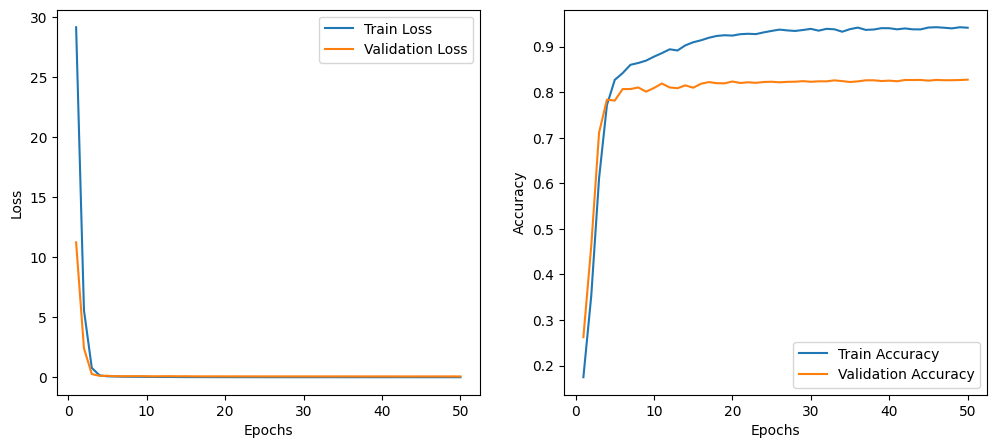

In [ ]:


# Create a new figure with specified size
plt.figure(figsize=(12, 5))

# Plot training and validation loss over epochs
plt.subplot(1, 2, 1)  # Create subplot (1 row, 2 columns, 1st plot)
plt.plot(range(1, train_config.num_epochs + 1), train_losses, label="Train Loss")  # Plot train loss
plt.plot(range(1, train_config.num_epochs + 1), val_losses, label="Validation Loss")  # Plot validation loss
plt.xlabel("Epochs")  # Label for x-axis
plt.ylabel("Loss")  # Label for y-axis
plt.legend()  # Show legend to differentiate lines

# Plot training and validation accuracy over epochs
plt.subplot(1, 2, 2)  # Create subplot (1 row, 2 columns, 2nd plot)
plt.plot(range(1, train_config.num_epochs + 1), train_accuracies, label="Train Accuracy")  # Plot train accuracy
plt.plot(range(1, train_config.num_epochs + 1), val_accuracies, label="Validation Accuracy")  # Plot validation accuracy
plt.xlabel("Epochs")  # Label for x-axis
plt.ylabel("Accuracy")  # Label for y-axis
plt.legend()  # Show legend to differentiate lines

plt.show()  # Display the plots

## prediction of validation data

In [ ]:


# ==== 1️⃣ Setup ====
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ==== 2️⃣ Load your trained model ====
model = resnet18(weights=None)
in_features = model.fc.in_features
model.fc = torch.nn.Linear(in_features, 2)   # predicting [Temperature, Tint]

model.load_state_dict(torch.load("best.pt", map_location=device))
model.to(device)
model.eval()

# ==== 3️⃣ Image preprocessing ====
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# ==== 4️⃣ Load validation/test CSV ====
csv_path = "/content/dataset/Validation/sliders_input.csv"
image_dir = "/content/dataset/Validation/images/"
df = pd.read_csv(csv_path)
df["image_path"] = df["id_global"].apply(lambda x: os.path.join(image_dir, f"{x}.tif"))

# ==== 5️⃣ Run inference ====
pred_temps, pred_tints = [], []

with torch.no_grad():
    for path in tqdm(df["image_path"], desc="Predicting"):
        try:
            img = Image.open(path).convert("RGB")
            img_tensor = transform(img).unsqueeze(0).to(device)

            outputs = model(img_tensor)
            outputs = outputs.cpu().numpy().flatten()

            temp_pred, tint_pred = outputs[0], outputs[1]

            # 🔁 Inverse normalization:
            # you said you trained with log(temp) and (tint+150)/30
            temp_pred = round(np.exp(temp_pred) )         # revert log()
            tint_pred = round((tint_pred * 30) - 150)   # revert scaling

            pred_temps.append(temp_pred)
            pred_tints.append(tint_pred)

        except Exception as e:
            print(f"Error on {path}: {e}")
            pred_temps.append(np.nan)
            pred_tints.append(np.nan)

# ==== 6️⃣ Create output DataFrame ====
output_df = pd.DataFrame({
    "id_global": df["id_global"],
    "Temperature": pred_temps,
    "Tint": pred_tints
})

# ==== 7️⃣ Save to CSV ====
output_csv_path = "/content/predictions_validation.csv"
output_df.to_csv(output_csv_path, index=False)

print(f"✅ Predictions saved successfully to: {output_csv_path}")


Predicting: 100%|██████████| 493/493 [00:04<00:00, 106.95it/s]

✅ Predictions saved successfully to: /content/predictions_validation.csv


# Observation

The methods used are

1.   Histogram + Random Forest Regressor
2.   Finetuning Resnet by unfreezing the layer4


ResNet model is more robust here because they learn contextual and relative color patterns, not absolute counts. Here resnet better performed on given validation data compared to hist+RF model.
